First implementation of a trajectory transformer, where each observation is a vector of [lat lon, sog, cog]

In [57]:

from collections import defaultdict
from typing import Iterator, List
from copy import deepcopy

import numpy as np 
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Sampler
import pickle 
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
import plotly.graph_objects as go

In [58]:
torch.set_default_dtype(torch.float64)
device = torch.device('cpu')

In [59]:
# Parameters (could move to config file if wanna be fancy)
do_training = True

train_path = '../data/marineTrainS.pkl'
val_path = '../Data/marineValMovingS.pkl'

d_model = 128 # Size of the embedding space
max_seq_len = 144 # Maximum number of observations per trajectory
min_seq_len = 24
input_dim = 4 # [lat, lon, sog, cog]
output_dim = input_dim # [lat, lon, sog, cog]
n_enc_layers = 6 
n_dec_layers = n_enc_layers
n_heads = 8 # number of attentionheads in the encoder and decoder
d_ff = 512 # Dimension of the ff nn at the end of a block

# lat and lon
min_lat = 53.4
max_lat = 66.2
min_lon = 9.4
max_lon = 30.5
latDif = max_lat - min_lat
lonDif = max_lon - min_lon
maxSpeed = 50
maxHeading = 360

batch_by_size = True
batch_size = 64
time_encoding = True

params = [input_dim, d_model, n_heads, n_enc_layers, n_dec_layers, d_ff, max_seq_len, output_dim, time_encoding, batch_size]

In [60]:
class PositionalEncoding(nn.Module):
    """
    Postional encoder using the sinusiodals from the original paper
    """
    def __init__(self, d_model, max_len):
        super(PositionalEncoding, self).__init__()
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype = torch.float32).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float()*(-torch.log(torch.tensor(10000.0))/d_model))
        pe[:, 0::2] = torch.sin(position*div_term)
        pe[:, 1::2] = torch.cos(position*div_term)
        pe = pe.unsqueeze(0)
        self.pe = pe.to(device)

    def forward(self, x):
        #print(x.size()) # 64, 40, 128 = bs, Time , d_model
        x = x + self.pe[:x.size(0), :x.size(1), :]
        return x

class TimeEncoding(torch.nn.Module):
 
    def __init__(self, d_model, max_seq_len, batch_size, norm_time_factor = 350000, normalized_time = True):
        super(TimeEncoding, self).__init__()
        self.d_model = d_model
        self.norm_time_factor = norm_time_factor
        self.max_seq_len= max_seq_len
        self.batch_size = batch_size
        indices = torch.arange(0, d_model, 2)
        indices_rep = indices.repeat_interleave(2)
        values = 1 / (10000 ** (2*indices_rep/d_model))
        block_matrix = torch.ones((batch_size, max_seq_len, d_model))
        self.basic_block = (block_matrix*values).to(device)
        self.normalized_time = normalized_time
 
 
    def forward(self, x_data, x_time):
        batch_size_curr, seq_time_current, d_model_current = x_data.size()
 
        if not self.normalized_time:
            # Normalize time to [0, 1]
            x_time = x_time / self.max_time  
 
 
        # Slice to fit shroter batches mayhaps
        te = x_time.unsqueeze(2) * self.basic_block[:batch_size_curr,:seq_time_current,:]
 
        # Trigger funcs for the different datapoints
        te[:, :, 0::2] = torch.sin(te[:, :, 0::2])
        te[:, :, 1::2] = torch.cos(te[:, :, 1::2])
 
        # Add positional encoding to the input data
        new_x = x_data + te
 
        return new_x



In [61]:
class TrajectoryEncoder(nn.Module):
    """
    Basic Encoder relying mainly on pytorchs modules 
    """
    def __init__(self, input_dim, d_model, n_heads, n_enc_layers, d_ff, max_len, time_encoding, batch_size):
        super(TrajectoryEncoder, self).__init__()
        self.emb_proj = nn.Linear(input_dim, d_model)
        self.pos_enc = PositionalEncoding(d_model, max_len)
        self.time_enc = TimeEncoding(d_model, max_len, batch_size)
        self.time_encoding = time_encoding
        self.batch_size = batch_size

        enc_layers = nn.TransformerEncoderLayer(d_model, n_heads, d_ff, batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(enc_layers, n_enc_layers)

    def forward(self, src):
        if self.time_encoding:
            src_features = src[:,:,:-1]
            src_timestamps = src[:,:,-1]
            x = self.emb_proj(src_features)
            x = self.time_enc(x, src_timestamps)
        else:
            x = self.emb_proj(src) # Take our input from input_dim to embedding-d
            x = self.pos_enc(x)
        x = self.transformer_encoder(x)
        return x

class TrajectoryDecoder(nn.Module):

    def __init__(self, input_dim, d_model, n_heads, n_dec_layers, d_ff, max_len, 
                 output_dim, time_encoding, batch_size):
        super(TrajectoryDecoder, self).__init__()
        self.emb_proj = nn.Linear(input_dim, d_model)
        self.emb_proj_time = nn.Linear(input_dim-1, d_model)
        self.pos_enc = PositionalEncoding(d_model, max_len)
        self.time_encoding = time_encoding
        self.time_enc = TimeEncoding(d_model, max_len, batch_size)
        self.batch_size = batch_size

        dec_layers = nn.TransformerDecoderLayer(d_model, n_heads, d_ff, batch_first=True)
        self.transformer_decoder = nn.TransformerDecoder(dec_layers, n_dec_layers)
        self.output_proj = nn.Linear(d_model, output_dim)

    def forward(self, tgt, memory, tgt_mask=None, memory_mask=None):
        """
        tgt (Tensor) = the sequence to the decoder (required).

        memory (Tensor) = the sequence from the last layer of the encoder. Size bs, T, n_emb
        """
        if self.time_encoding:
            tgt_features = tgt[:,:,:-1]
            tgt_timestamps = tgt[:,:,-1]
            target = self.emb_proj(tgt_features)
            target = self.time_enc(target, tgt_timestamps)

        else:
            tgt = self.emb_proj(tgt)
            target = self.pos_enc(tgt)

        decoded = self.transformer_decoder(target, memory, tgt_mask=tgt_mask, memory_mask=memory_mask)
        output = self.output_proj(decoded) # project down to output_dim
        return output

class TrajectoryAutoencoder(nn.Module):
    def __init__(self, input_dim, d_model, n_heads, n_enc_layers, n_dec_layers, d_ff, max_len, output_dim, time_encoding, batch_size):
        super(TrajectoryAutoencoder, self).__init__()
        self.encoder = TrajectoryEncoder(input_dim, d_model, n_heads, n_enc_layers, d_ff, max_len, time_encoding, batch_size)
        self.decoder = TrajectoryDecoder(input_dim, d_model, n_heads, n_dec_layers, d_ff, max_len, output_dim, time_encoding, batch_size)

    def forward(self, tgt):
        memory = self.encoder(tgt)
        tgt_mask = nn.Transformer.generate_square_subsequent_mask(tgt.size(1))
        reconstructed = self.decoder(tgt, memory, tgt_mask=tgt_mask)
        return reconstructed

In [62]:
class MarineDataset(Dataset):
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        return torch.from_numpy(self.data[idx]).to(device)

class MarineDatasetPadding(Dataset):
    def __init__(self, data_dictionary, min_seq_len, max_seq_len, input_dim):        
        self.min_seq_len = min_seq_len
        self.max_seq_len = max_seq_len
        self.input_dim = input_dim

        self.dict = data_dictionary
        self.keys = list(data_dictionary.keys())

        for key in self.keys:
            if len(self.dict[key]['traj']) < min_seq_len:
                del self.dict[key]
                self.keys.remove(key)

    def __len__(self):
        return len(self.dict)
    
    def __getitem__(self, idx):
        key = self.keys[idx]
        traj_data = self.dict[key]['traj']
        
        # Cut off the mmsi and timestamp and return trajectory
        if len(traj_data) >= self.max_seq_len:
            return torch.tensor(traj_data[:self.max_seq_len,:self.input_dim]).to(device)
        else: 
            needed_padding = self.max_seq_len - len(traj_data)
            res = F.pad(torch.tensor(traj_data[:,:self.input_dim]), (0, 0, 0, needed_padding), "constant", 0.0)
        
            return res.to(device)

class BatchBySizeSampler(Sampler[List[int]]):
    def __init__(self, data, batch_size, randomize=True):
        self.batch_size = batch_size
        self.randomize = randomize
        self.paths_by_length = defaultdict(list)
        for i in range(len(data)):
            self.paths_by_length[len(data[i])].append(i)
        self.num_batches = sum((len(xs) + batch_size - 1) // batch_size for xs in self.paths_by_length.values())

    def __len__(self):
        return self.num_batches

    def __iter__(self) -> Iterator[List[int]]:
        if self.randomize:
            for xs in self.paths_by_length.values():
                np.random.shuffle(xs)
        chunks = [xs[i : i + self.batch_size] for xs in self.paths_by_length.values() for i in range(0, len(xs), self.batch_size)]
        np.random.shuffle(chunks)
        yield from chunks


n_dims_to_load = input_dim
if time_encoding:
    n_dims_to_load += 1

with open(train_path, 'rb') as f:
    train_data = pickle.load(f)
    train_data = [x["traj"][:max_seq_len,:n_dims_to_load] for x in train_data.values() if len(x["traj"]) >= min_seq_len]
with open(val_path, 'rb') as f:
    val_data = pickle.load(f)
    val_data = [x["traj"][:max_seq_len,:n_dims_to_load] for x in val_data.values() if len(x["traj"]) >= min_seq_len]
train_dataloader_bbs = DataLoader(MarineDataset(train_data), batch_sampler=BatchBySizeSampler(train_data, batch_size))
validation_dataloader_bbs = DataLoader(MarineDataset(val_data), batch_sampler=BatchBySizeSampler(val_data, batch_size))

with open(train_path, 'rb') as f:
    train_data = pickle.load(f)
with open(val_path, 'rb') as f:
    val_data = pickle.load(f)
train_dataset = MarineDatasetPadding(train_data, min_seq_len=min_seq_len, max_seq_len=max_seq_len, input_dim=n_dims_to_load)
train_dataloader_no_bbs = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_dataset = MarineDatasetPadding(val_data, min_seq_len=min_seq_len, max_seq_len=max_seq_len, input_dim=n_dims_to_load)
validation_dataloader_no_bbs = DataLoader(validation_dataset, batch_size=batch_size, shuffle=True)

In [63]:
def train_loop(model, dataloader, criterion, optimizer, time_encoding ):
    train_data_size = len(dataloader.dataset)
    model.train()
    cum_loss = 0.0
    count_trained_on = 0
    for batch, X in enumerate(dataloader):
        optimizer.zero_grad()
        output = model(X)
        if time_encoding:
            loss = criterion(output, X[:,:,:-1])
        else:
            loss = criterion(output, X)
        loss.backward()
        optimizer.step()
        cum_loss += loss.item()

        count_trained_on += len(X)
        if batch % 50 == 0:
            print(f' loss {loss.item():>4f} [{count_trained_on:>5d} / {train_data_size:>5d} ]', flush=True)
    return cum_loss / len(dataloader)

def test_loop(model, dataloader, criterion, time_encoding):
    model.eval()
    cum_loss = 0.0
    loss = []
    with torch.no_grad():
        for X in dataloader:
            pred = model(X)
            if time_encoding:
                current_loss = criterion(X[:,:,:-1], pred).item()
            else:
                current_loss = criterion(X, pred).item()
            cum_loss += current_loss

            loss.append(current_loss)

    print(f'Test set: \nCumulative loss: {cum_loss}, Average Loss {np.mean(loss):>8f}')
    return cum_loss / len(dataloader)

In [64]:
model = TrajectoryAutoencoder(*params)
model = model.to(device)
criterion = nn.MSELoss()

learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

warmup = 20

# Linear increase to 1e-4 until warmup finished, then exp decay for remainder of time
L1 = lambda epoch: (epoch+1) / (warmup + 1) if epoch < warmup else torch.e**((warmup - epoch)/10)

scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, L1)


n_epochs = 1

training_loss = torch.zeros(n_epochs)
val_loss = torch.zeros(n_epochs)

min_val_loss = 10000
patience = 10
val_counter = 0

best_state_dict = None

if do_training:
    for epoch in range(n_epochs):
        print(f'Fuck you; It\'s epoch #{epoch + 1}')
        current_training_loss = train_loop(model, dataloader=train_dataloader_bbs, criterion=criterion, optimizer=optimizer, time_encoding=time_encoding)
        current_val_loss = test_loop(model, dataloader=validation_dataloader_bbs, criterion=criterion, time_encoding=time_encoding)

        training_loss[epoch] = current_training_loss
        val_loss[epoch]  = current_val_loss

        scheduler.step()

        if epoch > warmup:
            if current_val_loss > min_val_loss:
                val_counter += 1
                if val_counter == patience: 
                    print(f'Patience limit reached at epoch {epoch}')
                    break

            else:
                val_counter = 0
                min_val_loss = current_val_loss
                best_state_dict = deepcopy(model.state_dict())



    save_after_training = True
    savename = 'time_as_pe_working'
    if save_after_training:
        loss_dict = {
            'training_loss': training_loss, 
            'val_loss': val_loss
            }
        torch.save(best_state_dict, f'./traj_trans_2307_{savename}.pt')
        torch.save(loss_dict, f'./loss_history_2307_{savename}.pt')

In [65]:
model = TrajectoryAutoencoder(*params)
model = model.to(device)
criterion = nn.MSELoss()

learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

warmup = 20

# Linear increase to 1e-4 until warmup finished, then exp decay for remainder of time
L1 = lambda epoch: (epoch+1) / (warmup + 1) if epoch < warmup else torch.e**((warmup - epoch)/10)

scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, L1)


n_epochs = 100



training_loss = torch.zeros(n_epochs)
val_loss = torch.zeros(n_epochs)

min_val_loss = 10000
patience = 5
val_counter = 0


if do_training:
    for epoch in range(n_epochs):
        print(f'Fuck you; It\'s epoch #{epoch + 1}')
        current_training_loss = train_loop(model, dataloader=train_dataloader_no_bbs, criterion=criterion, optimizer=optimizer, time_encoding=time_encoding)
        current_val_loss = test_loop(model, dataloader=validation_dataloader_no_bbs, criterion=criterion, time_encoding=time_encoding)

        training_loss[epoch] = current_training_loss
        val_loss[epoch]  = current_val_loss

        scheduler.step()

        if current_val_loss > min_val_loss:
            val_counter += 1
            if val_counter == patience: 
                break
        else:
            val_counter = 0
            min_val_loss = current_val_loss



    save_after_training = True
    savename = 'no_bbs_time_as_pe_working'
    if save_after_training:
        loss_dict = {
            'training_loss': training_loss, 
            'val_loss': val_loss
            }
        save_string = 'fail_and_error'
        torch.save(model.state_dict(), f'./traj_trans_2307_{savename}.pt')
        torch.save(loss_dict, f'./loss_history_2307_{savename}.pt')

In [66]:
def plot_some_paths( model, val_loader, criterion):
    model.eval()

    rand_sample = next(iter(val_loader))[0]
    rand_sample = rand_sample.unsqueeze(0)
    with torch.no_grad():
        recon_sample = model(rand_sample)

    recon_sample = recon_sample.squeeze()
    rand_sample = rand_sample.squeeze()
    
    meas_x, meas_y = [], []
    model_x, model_y = [], []

    for i in range(len(rand_sample)):
        meas_y.append(rand_sample[i,0].item())
        meas_x.append(rand_sample[i,1].item())
        model_y.append(recon_sample[i,0].item())
        model_x.append(recon_sample[i,1].item())

    rand_sample = rand_sample[:, :-1]
    print(rand_sample.size(), "yep", recon_sample.size())
    mse_error = criterion(rand_sample, recon_sample)

    plt.plot(meas_x, meas_y, 'b', label = "True traj")
    plt.plot(model_x, model_y, 'k', label = "Est path")
    plt.title(f"MSE = {mse_error:.6f}")
    plt.legend()

    plt.show()

torch.Size([58, 4]) yep torch.Size([58, 4])


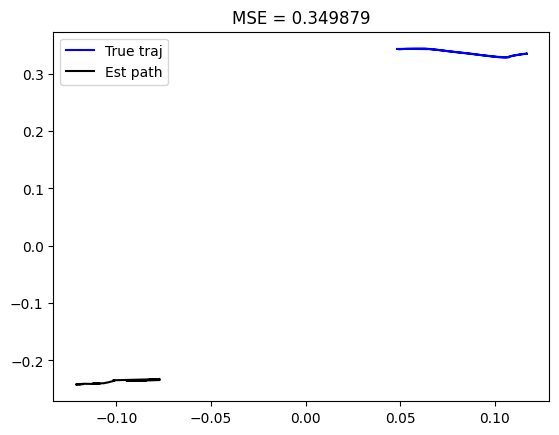

In [67]:
plot_some_paths(model, validation_dataloader_bbs, criterion)

In [68]:
model2 = TrajectoryAutoencoder(*params)
model2.load_state_dict(torch.load('./traj_trans_2407_time_as_pe_working.pt', map_location=device))

<All keys matched successfully>

torch.Size([74, 4]) yep torch.Size([74, 4])


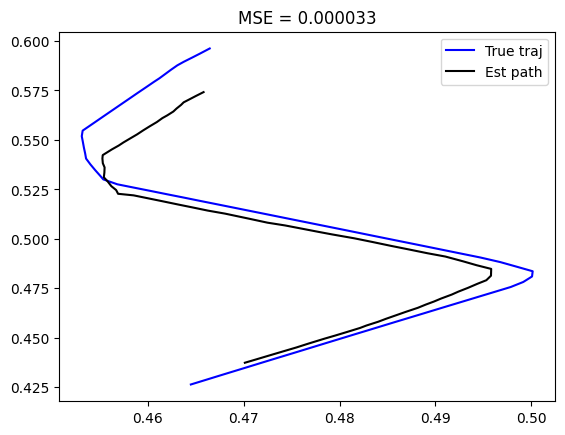

In [69]:
criterion = nn.MSELoss()
plot_some_paths(model2, validation_dataloader_bbs, criterion)

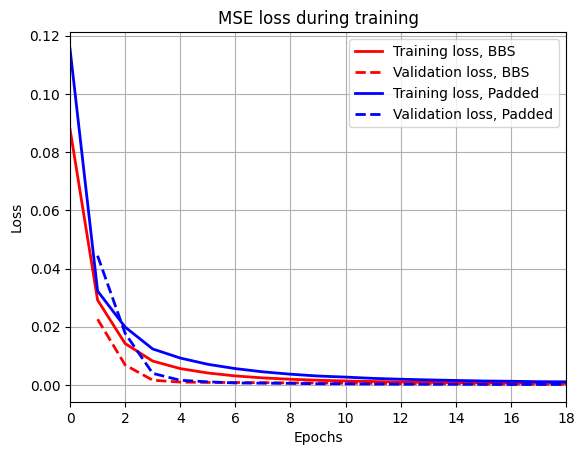

In [70]:
loss_dict_m2 = torch.load('./loss_history_2407_no_bbs_time_as_pe_working.pt')
loss_dict_m3 = torch.load('./loss_history_2407_time_as_pe_working.pt')

plt.plot(loss_dict_m2['training_loss']/len(train_dataloader_bbs), label = 'Training loss, BBS', linewidth=2, color = "red")

plt.plot( range(1, len(loss_dict_m3['val_loss'])+1), loss_dict_m3['val_loss']/len(validation_dataloader_bbs), "--", label = 'Validation loss, BBS', linewidth=2, color="red")
plt.plot(loss_dict_m3['training_loss']/len(train_dataloader_no_bbs), label = 'Training loss, Padded', linewidth=2, color="blue")
plt.plot(range(1, len(loss_dict_m2['val_loss'])+1), loss_dict_m2['val_loss']/len(validation_dataloader_no_bbs), "--", label = 'Validation loss, Padded', linewidth=2, color="blue")
plt.grid(True)
plt.legend()

plt.xlim([0 , 18])
#plt.ylim([0 , ])

plt.title('MSE loss during training')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

In [87]:
def grab_latent(model, data_loader, cap=None):
    model.eval()

    X = []
    latent = []
    for batch in data_loader:
        if cap and len(X) >= cap:
            continue
        
        with torch.no_grad():
            latent_embeddings = model.encoder(batch)
        
        for path, embedding in zip(batch, latent_embeddings):
            if cap is None or len(X) < cap:
                X.append(path)
                latent.append(embedding.mean(0))

    return X, latent

In [72]:
def plot_some_paths_on_map(model, actual, anomaly, fig):
    model.eval()
    
    meas_x, meas_y = [], []

    for i in range(len(actual)):
        meas_y.append((actual[i,0].item() * latDif) + min_lat)
        meas_x.append((actual[i,1].item() * lonDif) + min_lon)

    color = "red" if anomaly else "rgba(0, 0, 255, 0.4)"
    fig.add_trace(go.Scattergeo(
            lat=meas_y,
            lon=meas_x,
            mode='lines',
            showlegend=False,
            line=dict(width=2, color=color)
        ))

    return fig

In [88]:
def train_classifier(classifier, model, validation_dataloader_bbs, num_train_examples=None):
    _, latent = grab_latent(model, validation_dataloader_bbs, num_train_examples)
    classifier.fit(latent)
    return classifier

In [74]:
def plot_preds(clf, model, validation_dataloader_bbs, num_samples=None):
    # Create Background
    fig = go.Figure(go.Scattergeo())
    fig.update_geos(
        lataxis_range=[min_lat,max_lat], lonaxis_range=[min_lon, max_lon]
    )
    fig.update_layout(
        geo=dict(resolution=50),
        dragmode = False)
    size_scale = 800
    lat_over_lon_quote = latDif / lonDif
    fig.update_layout(height=size_scale * lat_over_lon_quote, width=size_scale, margin={"r":0,"t":0,"l":0,"b":0})

    X, latent = grab_latent(model, validation_dataloader_bbs, num_samples)
    classifications = clf.predict(latent)
    anomalies_detected = 0
    for i in range(len(classifications)):
        plot_some_paths_on_map(model, X[i], classifications[i] == -1, fig)
        anomalies_detected += classifications[i] == -1
        
    print(classifications)
    print("Anomalies Detected: ", anomalies_detected)
    fig.add_trace(go.Scattergeo(
            lat=[0],
            lon=[0],
            mode='lines',
            showlegend=True,
            name = 'conformative',
            line=dict(width=2, color='blue')
        ))
    fig.add_trace(go.Scattergeo(
            lat=[0],
            lon=[0],
            mode='lines',
            showlegend=True,
            name = 'anomalous',
            line=dict(width=2, color='red')
        ))
    
    fig.update_layout(legend=dict(
        yanchor="top",
        y=0.98,
        xanchor="left",
        x=0.83
    ))
    fig.show()

In [91]:
clf = IsolationForest(contamination=0.05, bootstrap=True, n_jobs=-1, random_state=42)
clf_if = train_classifier(clf, model2, train_dataloader_bbs)

In [92]:
clf = LocalOutlierFactor(contamination=0.05, n_jobs=-1, novelty=True)
clf_lof = train_classifier(clf, model2, train_dataloader_bbs)

In [93]:
plot_preds(clf_if, model2, validation_dataloader_bbs)

[1 1 1 ... 1 1 1]
Anomalies Detected:  52


In [94]:
plot_preds(clf_lof, model2, validation_dataloader_bbs)

[1 1 1 ... 1 1 1]
Anomalies Detected:  49
